In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/plant-village-dataset/PlantVillageDataset/PlantVillage/PlantVillage/Pepper__bell___Bacterial_spot/0f72db9c-d635-4415-9781-68937328aed2___NREC_B.Spot 9188.JPG
/kaggle/input/plant-village-dataset/PlantVillageDataset/PlantVillage/PlantVillage/Pepper__bell___Bacterial_spot/1b8d3e98-43d9-441d-93ef-a359e6e9ddc2___NREC_B.Spot 9052.JPG
/kaggle/input/plant-village-dataset/PlantVillageDataset/PlantVillage/PlantVillage/Pepper__bell___Bacterial_spot/b6d35d21-4812-4e32-ab9a-b6ddda8cbb79___JR_B.Spot 8972.JPG
/kaggle/input/plant-village-dataset/PlantVillageDataset/PlantVillage/PlantVillage/Pepper__bell___Bacterial_spot/e4e7e5a2-5aa1-4378-833d-9142358c7c9b___JR_B.Spot 9092.JPG
/kaggle/input/plant-village-dataset/PlantVillageDataset/PlantVillage/PlantVillage/Pepper__bell___Bacterial_spot/8b50f2db-cbf2-4758-bea6-a011f0cc1497___JR_B.Spot 3235.JPG
/kaggle/input/plant-village-dataset/PlantVillageDataset/PlantVillage/PlantVillage/Pepper__bell___Bacterial_spot/729b55d7-2a99-4861-910d-3b4e2bbce1

In [73]:
import tensorflow as tf
import numpy as np
import pandas as pd
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model, Sequential
import os
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import keras 
from keras.callbacks import EarlyStopping,ModelCheckpoint
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from tqdm import tqdm
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras import layers, models

In [63]:
def data(dataset_path):
    images = []
    labels = []
    for subfolder in os.listdir(dataset_path):
        subfolder_path = os.path.join(dataset_path, subfolder)
        for image_filename in os.listdir(subfolder_path):
            image_path = os.path.join(subfolder_path, image_filename)
            images.append(image_path)
            labels.append(subfolder)
    return pd.DataFrame({'image': images, 'label': labels})

In [64]:
dataset_path = '/kaggle/input/plantvillage-dataset/color'
data_df = data(dataset_path)

In [65]:
X_train, X_test1, y_train, y_test1 = train_test_split(
    data_df['image'], data_df['label'], test_size=0.2, random_state=42, stratify=data_df['label']
)
X_val, X_test, y_val, y_test = train_test_split(
    X_test1, y_test1, test_size=0.5, random_state=42, stratify=y_test1
)


In [66]:
image_size = (224, 224)
batch_size = 32

In [ ]:
df_train = pd.DataFrame({'image': X_train, 'label': y_train})
df_val = pd.DataFrame({'image': X_val, 'label': y_val})
df_test = pd.DataFrame({'image': X_test, 'label': y_test})


In [67]:
df_train['label'] = pd.Categorical(df_train['label']).codes
df_val['label'] = pd.Categorical(df_val['label']).codes
df_test['label'] = pd.Categorical(df_test['label']).codes
# Encode labels to strings for compatibility with class_mode='categorical'
df_train['label'] = pd.Categorical(df_train['label']).categories[df_train['label']].astype(str)
df_val['label'] = pd.Categorical(df_val['label']).categories[df_val['label']].astype(str)
df_test['label'] = pd.Categorical(df_test['label']).categories[df_test['label']].astype(str)

In [68]:
datagen = ImageDataGenerator(rescale=1./255)
train_datagen = ImageDataGenerator(
    rescale=1./255,
    horizontal_flip=True
)

In [47]:
train_generator = train_datagen.flow_from_dataframe(
    df_train,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

val_generator = datagen.flow_from_dataframe(
    df_val,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

test_generator = datagen.flow_from_dataframe(
    df_test,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

Found 43444 validated image filenames belonging to 38 classes.
Found 5430 validated image filenames belonging to 38 classes.
Found 5431 validated image filenames belonging to 38 classes.


In [69]:
df_train.label.value_counts().to_frame()

,count
label,
35,4405
22,4286
9,4072
36,1838
14,1701
17,1527
10,1468
19,1417
20,1341


In [71]:
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False

29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [74]:
num_classes = len(train_generator.class_indices)
model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(1024, activation='relu'),  # You can adjust this layer's size
    layers.Dense(num_classes, activation='softmax')  # Softmax for multi-class classification
])

In [75]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy', tf.keras.metrics.AUC()]
)

In [76]:
with tf.device('/GPU:0'):
    history = model.fit(
    train_generator,
    epochs=20,
    validation_data=val_generator,
    )

Epoch 1/20


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1358/1358 ━━━━━━━━━━━━━━━━━━━━ 197s 126ms/step - accuracy: 0.8287 - auc_3: 0.9845 - loss: 0.6117 - val_accuracy: 0.9481 - val_auc_3: 0.9985 - val_loss: 0.1585
Epoch 2/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 130s 95ms/step - accuracy: 0.9466 - auc_3: 0.9987 - loss: 0.1574 - val_accuracy: 0.9473 - val_auc_3: 0.9979 - val_loss: 0.1586
Epoch 3/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 129s 95ms/step - accuracy: 0.9570 - auc_3: 0.9988 - loss: 0.1263 - val_accuracy: 0.9564 - val_auc_3: 0.9980 - val_loss: 0.1382
Epoch 4/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 129s 95ms/step - accuracy: 0.9642 - auc_3: 0.9993 - loss: 0.1018 - val_accuracy: 0.9562 - val_auc_3: 0.9982 - val_loss: 0.1285
Epoch 5/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 130s 95ms/step - accuracy: 0.9702 - auc_3: 0.9991 - loss: 0.0844 - val_accuracy: 0.9519 - val_auc_3: 0.9975 - val_loss: 0.1425
Epoch 6/20
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 130s 95ms/step - accuracy: 0.9745 - auc_3: 0.9994 - loss: 0.0743 - val_accuracy: 0.9556 - val_auc_3: 0.9968 - val_loss: 0.1

In [77]:
hist_=pd.DataFrame(history.history)
hist_

,accuracy,auc_3,loss,val_accuracy,val_auc_3,val_loss
0,0.898237,0.996209,0.332364,0.948066,0.998469,0.158484
1,0.948416,0.998601,0.153810,0.947330,0.997926,0.158600
2,0.956381,0.998793,0.126030,0.956354,0.998012,0.138216
3,0.962964,0.999036,0.106626,0.956169,0.998236,0.128534
4,0.969455,0.999108,0.087922,0.951934,0.997461,0.142530
5,0.972954,0.999313,0.078242,0.955617,0.996839,0.143385
6,0.975117,0.999379,0.068147,0.961694,0.997147,0.131041
7,0.978593,0.999540,0.060768,0.962431,0.997540,0.120970
8,0.979491,0.999486,0.058829,0.969797,0.997954,0.100987
9,0.983266,0.999535,0.049070,0.962063,0.997342,0.122472


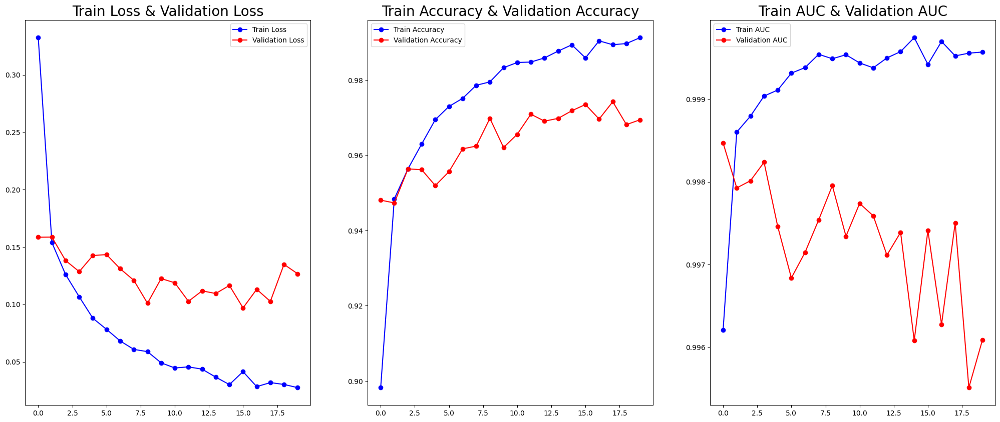

In [79]:
plt.figure(figsize=(25, 10))

plt.subplot(1, 3, 1)
plt.plot(hist_['loss'], 'b-o', label='Train Loss')
plt.plot(hist_['val_loss'], 'r-o', label='Validation Loss')
plt.title('Train Loss & Validation Loss', fontsize=20)
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(hist_['accuracy'], 'b-o', label='Train Accuracy')
plt.plot(hist_['val_accuracy'], 'r-o', label='Validation Accuracy')
plt.title('Train Accuracy & Validation Accuracy', fontsize=20)
plt.legend()

if 'auc_3' in hist_.columns and 'val_auc_3' in hist_.columns:
    plt.subplot(1, 3, 3)
    plt.plot(hist_['auc_3'], 'b-o', label='Train AUC')
    plt.plot(hist_['val_auc_3'], 'r-o', label='Validation AUC')
    plt.title('Train AUC & Validation AUC', fontsize=20)
    plt.legend()

plt.show()


In [80]:
# After training, evaluate the model on the test data
test_loss, test_accuracy, test_auc = model.evaluate(test_generator)

# Print the test results
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")
print(f"Test AUC: {test_auc}")


170/170 ━━━━━━━━━━━━━━━━━━━━ 25s 147ms/step - accuracy: 0.9698 - auc_3: 0.9956 - loss: 0.2075
Test Loss: 0.12869350612163544
Test Accuracy: 0.9745903015136719
Test AUC: 0.996289849281311


170/170 ━━━━━━━━━━━━━━━━━━━━ 28s 123ms/step
F1 Score (Micro Average): 0.9746


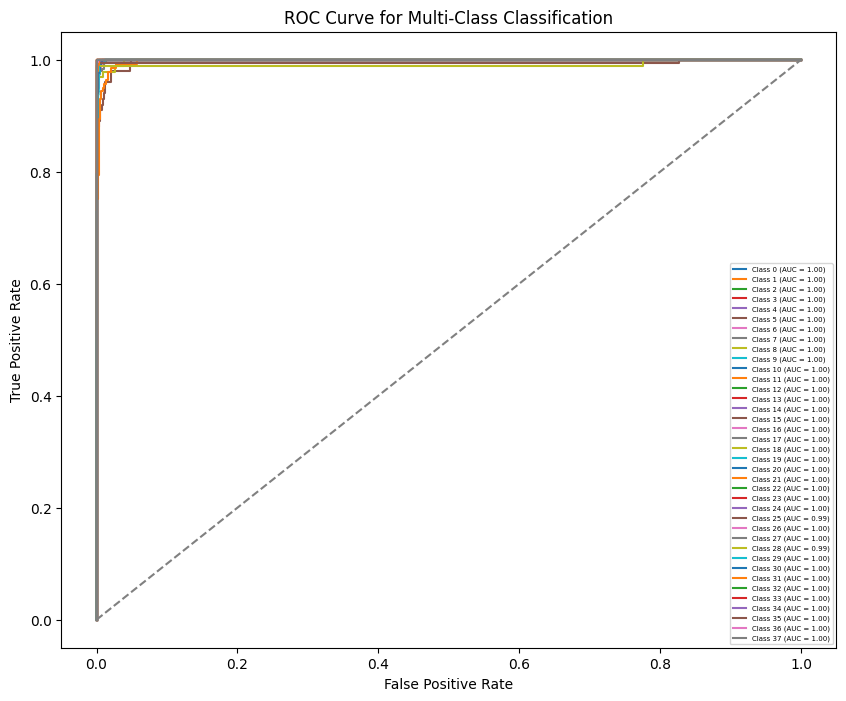


Classification Report:
              precision    recall  f1-score   support

           0       0.95      1.00      0.98        63
           1       1.00      0.97      0.98        62
          10       0.95      0.99      0.97        99
          11       0.99      0.99      0.99       148
          12       1.00      0.93      0.96        27
          13       0.99      0.98      0.98       100
          14       0.99      0.90      0.94       100
          15       0.92      0.73      0.81        15
          16       1.00      1.00      1.00        37
          17       0.99      1.00      1.00       509
          18       1.00      1.00      1.00       184
          19       0.97      1.00      0.98       111
           2       1.00      1.00      1.00       116
          20       1.00      0.96      0.98        45
          21       0.97      0.98      0.97       213
          22       0.86      0.87      0.87       100
          23       1.00      0.99      0.99       165
   

In [81]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import roc_curve, auc, f1_score, classification_report
from sklearn.preprocessing import label_binarize

# Get true labels and predicted probabilities
y_true = test_generator.classes  # True class indices
y_pred = model.predict(test_generator)  # Predicted probabilities

# For multi-class classification, convert true labels to one-hot encoding
y_true_one_hot = label_binarize(y_true, classes=np.arange(len(test_generator.class_indices)))

# Calculate F1 Score (micro average for multi-class)
y_pred_classes = np.argmax(y_pred, axis=1)  # Predicted class indices
f1 = f1_score(y_true, y_pred_classes, average='micro')  # Micro average F1 score
print(f"F1 Score (Micro Average): {f1:.4f}")

# ROC Curve for multi-class classification (one-vs-rest)
fpr, tpr, roc_auc = {}, {}, {}
for i in range(len(test_generator.class_indices)):
    fpr[i], tpr[i], _ = roc_curve(y_true_one_hot[:, i], y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve
plt.figure(figsize=(10, 8))
for i in range(len(test_generator.class_indices)):
    plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

# Plot the diagonal (random classifier)
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.title('ROC Curve for Multi-Class Classification')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(fontsize=5)
plt.show()

# Print Classification Report with Precision, Recall, and F1 Score for each class
print("\nClassification Report:")
report = classification_report(y_true, y_pred_classes, target_names=list(test_generator.class_indices.keys()))
print(report)


In [82]:
CM = confusion_matrix(y_test,y_pred)
plt.figure(figsize=(15,25))
sns.heatmap(CM,fmt='g',center = True,cbar=False,annot=True,cmap='Set2',xticklabels=class_,yticklabels=class_)
CM

ValueError: Classification metrics can't handle a mix of multiclass and continuous-multioutput targets

170/170 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step


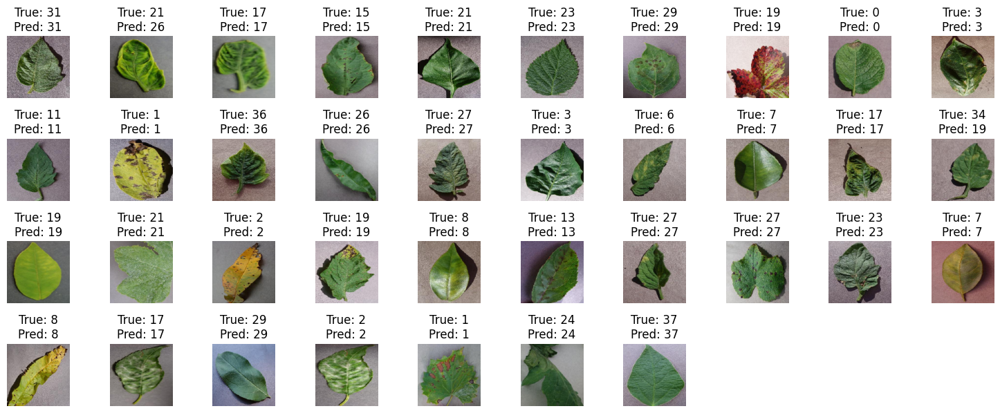

In [83]:
import matplotlib.pyplot as plt
import numpy as np

# Get the class indices mapping
class_indices = {v: k for k, v in test_generator.class_indices.items()}  # Reverse the mapping

# Predict on the test set
y_pred = model.predict(test_generator)
y_pred_classes = np.argmax(y_pred, axis=1)  # Predicted class indices
y_true_classes = test_generator.classes  # True class indices

# Display 9 images with their true and predicted labels
plt.figure(figsize=(15, 15))
for i in range(37):
    # Get a batch of data
    img, label = test_generator[i]
    
    # Select the first image from the batch
    image = img[0]
    true_label = class_indices[y_true_classes[i]]
    pred_label = class_indices[y_pred_classes[i]]

    # Plot the image
    plt.subplot(10, 10, i + 1)
    plt.imshow(image)
    plt.title(f"True: {true_label}\nPred: {pred_label}")
    plt.axis('off')

plt.tight_layout()
plt.show()


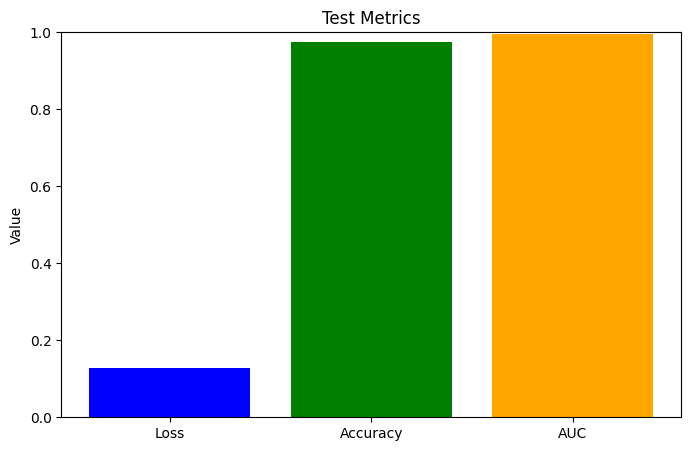

In [84]:
# Visualize test metrics
metrics = ['Loss', 'Accuracy', 'AUC']
values = [test_loss, test_accuracy, test_auc]

plt.figure(figsize=(8, 5))
plt.bar(metrics, values, color=['blue', 'green', 'orange'])
plt.title('Test Metrics')
plt.ylim(0, 1)
plt.ylabel('Value')
plt.show()


In [85]:
base_model.trainable = True
for layer in base_model.layers[:100]:
    layer.trainable = False

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), 
    loss='categorical_crossentropy',
    metrics=['accuracy', tf.keras.metrics.AUC()]
)

history_fine_tune = model.fit(
    train_generator,
    epochs=,
    validation_data=val_generator
)


Epoch 1/3
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 438s 250ms/step - accuracy: 0.9208 - auc_4: 0.9758 - loss: 0.9710 - val_accuracy: 0.9818 - val_auc_4: 0.9974 - val_loss: 0.0754
Epoch 2/3
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 277s 204ms/step - accuracy: 0.9829 - auc_4: 0.9976 - loss: 0.0767 - val_accuracy: 0.9873 - val_auc_4: 0.9980 - val_loss: 0.0606
Epoch 3/3
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 277s 203ms/step - accuracy: 0.9874 - auc_4: 0.9986 - loss: 0.0524 - val_accuracy: 0.9873 - val_auc_4: 0.9983 - val_loss: 0.0553


In [86]:
# After training, evaluate the model on the test data
test_loss, test_accuracy, test_auc = model.evaluate(test_generator)

# Print the test results
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")
print(f"Test AUC: {test_auc}")


170/170 ━━━━━━━━━━━━━━━━━━━━ 19s 112ms/step - accuracy: 0.9828 - auc_4: 0.9974 - loss: 0.1752
Test Loss: 0.091816745698452
Test Accuracy: 0.9863744974136353
Test AUC: 0.9977234601974487
